# Analysis Model Scripts



#### Bayes RL
- trace plots
- posterior analysis
- rhat values

#### Ridge Regression
- Visual plots
- F-test
- MI
- Ridge



In [2]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
from scipy import stats
from tqdm import tqdm
import pandas as pd
import numpy as np
import arviz as az
import pickle
import math

# Load models

In [3]:
loc = './final objects'

# bio models -----*
bio_model_top = np.load(loc + '/null_model_top.npz', allow_pickle=True)
bio_model_ran = np.load(loc + '/null_model_ran.npz', allow_pickle=True)

# wcst data -----*
wcst_top100     = pd.read_csv(loc + '/df_wcst_top_100.csv')
wcst_ran100     = pd.read_csv(loc + '/wcst_random_set.csv')

# psychological covariates -----*
psy_top100     = pd.read_csv(loc + '/psy_covars_top100.csv')
psy_ran100     = pd.read_csv(loc + '/psy_covars_ran100.csv')

# demographic covariates -----*
dem_top100     = pd.read_csv(loc + '/dem_covars_top100.csv')
dem_ran100     = pd.read_csv(loc + '/dem_covars_ran100.csv')

# Bayesian Posterior Analysis

In [4]:
# extract data ----------------------------------------*
alpha   = pd.DataFrame.from_records(bio_model_top['arr_0'].tolist()['a'])
beta    = pd.DataFrame.from_records(bio_model_top['arr_0'].tolist()['b'])

a_mu  = bio_model_top['arr_0'].tolist()['a_mu']
b_mu  = bio_model_top['arr_0'].tolist()['b_mu']
a_sd  = bio_model_top['arr_0'].tolist()['a_sd_raw']
b_sd  = bio_model_top['arr_0'].tolist()['b_sd_raw']



def generate_data(bio_mod):
    alpha   = pd.DataFrame.from_records(bio_mod['arr_0'].tolist()['a'])
    beta    = pd.DataFrame.from_records(bio_mod['arr_0'].tolist()['b'])

    a_mu  = bio_mod['arr_0'].tolist()['a_mu']
    b_mu  = bio_mod['arr_0'].tolist()['b_mu']
    a_sd  = bio_mod['arr_0'].tolist()['a_sd_raw']
    b_sd  = bio_mod['arr_0'].tolist()['b_sd_raw']

    return {'alpha': alpha, 'beta': beta, 'a_mu': a_mu, 'b_mu': b_mu, 'a_sd': a_sd, 'b_sd': b_sd}


data = {}
data['top'] = generate_data(bio_model_top)
data['ran'] = generate_data(bio_model_ran)


# Posteriors

# Posteriors

In [14]:

# generate data 


col = 'steelblue'; col2='#6b8659'; col2='#58022c'

c1 = '#f7cac9'
c2 = '#f7cac9'
c3 = '#dec2cb'
c4 = '#c5b9cd'
c5 = '#abb1cf'
c6 = '#92a8d1'




fig = make_subplots(rows=2, cols=2)

# alpha

# generate data 
x_alpha     = np.linspace(0.8, 1, 100)


def gen_alpha_plot(a_mu, colr, name='', mult=3.5):
    rv_alpha   = stats.norm(a_mu.mean(), a_mu.std()).pdf(x_alpha)
    fig.add_trace(go.Scatter(x=x_alpha, y=rv_alpha*mult,  mode='lines', name=name, opacity=1, fill='toself', line_color=colr))
    fig.add_trace(go.Scatter(y=a_mu,  mode='lines', name='Posterior', line_color=colr, showlegend=False), row=1, col=2)
    fig.add_trace(go.Histogram(x=a_mu, marker_color=colr, opacity=0.8,  showlegend=False), row=1, col=1) 

gen_alpha_plot(data['ran']['a_mu'], c1, name='a ~ P(random)', mult=8)
gen_alpha_plot(data['top']['a_mu'], c6, name='a ~ P(top)', mult=8)


x_beta     = np.linspace(4.5, 6.5, 100)
rv_beta    = stats.norm(b_mu.mean(), b_mu.std()).pdf(x_beta)

def gen_beta_plot(b_mu, colr, name='', mult=3.5):
    rv_beta    = stats.norm(b_mu.mean(), b_mu.std()).pdf(x_beta)
    fig.add_trace(go.Scatter(x=x_beta, y=rv_beta*mult,  mode='lines', name=name, opacity=1, fill='toself', line_color=colr), row=2, col=1)
    fig.add_trace(go.Scatter(y=b_mu,  mode='lines', name='Posterior', line_color=colr, showlegend=False), row=2, col=2)
    fig.add_trace(go.Histogram(x=b_mu, marker_color=colr, opacity=0.8,  showlegend=False), row=2, col=1) 


gen_beta_plot(data['ran']['b_mu'], c1, name='b ~ P(random)', mult=35)
gen_beta_plot(data['top']['b_mu'], c6, name='b ~ P(top)', mult=35)

# beta
# fig.add_trace(go.Scatter(x=x_beta, y=rv_beta*40,  mode='lines', name='b ~ P(b|X)',  opacity=0.8, fill='toself', line_color=col2), row=2, col=1) # fillcolor='rgba(231,107,243,0.2)', line_color='rgba(255,255,255,0)',))
# fig.add_trace(go.Scatter(y=b_mu,  mode='lines', name='Posterior', line_color=col2, showlegend=False), row=2, col=2)
# fig.add_trace(go.Histogram(x=b_mu, marker_color=col2, opacity=0.5,  showlegend=False), row=2, col=1) # histnorm='percent',



    # marker_color='#EB89B5',
    # opacity=0.75


fig.update_layout(height=600, width=1500, title_text="Posterior distributions", template='none')

fig.show()


In [15]:


def generate_posterior_samples(data=data['ran'], title='Subject posterior samples'):
  # generate data 
  x_beta_   = np.linspace(0, 10, 100)
  x_alpha_  = np.linspace(0, 1, 100)
  a_mu      = data['a_mu']
  b_mu      = data['b_mu']
  alpha     = data['alpha']
  beta      = data['beta']
  rv_alpha  = stats.norm(a_mu.mean(), a_mu.std()).pdf(x_alpha_)
  rv_beta    = stats.norm(b_mu.mean(), b_mu.std()).pdf(x_beta_)

  # posteriors
  fig = make_subplots(rows=1, cols=2)
  fig.add_trace(go.Scatter(x=x_alpha_, y=rv_alpha,  mode='lines', name='a ~ N(µ_a, sig_a)',  fill='toself', line_color=c6, showlegend=True,))
  fig.add_trace(go.Scatter(x=x_beta_, y=rv_beta,  mode='lines', name='b ~ N(µ_b, sig_b)',  fill='toself', line_color=c1, showlegend=True), row=1, col=2)

  # alphas
  for c in alpha.columns:
    col = np.random.choice([c1,c2,c3,c4,c5,c6])
    y = stats.norm(alpha[c].values.mean(), alpha[c].values.std()).pdf(x_alpha_)
    fig.add_trace(go.Scatter(x=x_alpha_, y=y,  mode='lines', showlegend=False, line=dict(color=col, width=1)))

  # betas
  for c in beta.columns:
    col = np.random.choice([c1,c2,c3,c4,c5,c6])
    y = stats.norm(beta[c].values.mean(), beta[c].values.std()).pdf(x_beta_)
    fig.add_trace(go.Scatter(x=x_beta_, y=y,  mode='lines', showlegend=False, line=dict(color=col, width=1)), row=1, col=2)

  fig.update_layout(template='none', title=title)
  return fig


generate_posterior_samples(data['top'], title='Subject posterior samples ~ Top').show()
generate_posterior_samples(data['ran'], title='Subject posterior samples ~ Random').show()

# Individual subjects

In [42]:
import seaborn as sns
palette = sns.color_palette(None, 300)
palette[0]

import colorsys
from matplotlib import cm
colours = cm.rainbow(np.linspace(0, 1, 12))
colours

# pinkly

px.colors.sequential.Pinkyl




[(0.05356262, 0.01950702, 0.03018802),
 (0.06598247, 0.0275665, 0.04691409),
 (0.07409947, 0.03358324, 0.05834631),
 (0.08611731, 0.04339148, 0.07538208),
 (0.09405308, 0.04985685, 0.08673591),
 (0.10587261, 0.05922941, 0.103854),
 (0.11370826, 0.06527747, 0.11536893),
 (0.12541095, 0.07407363, 0.1328442),
 (0.13317849, 0.07976988, 0.14465095),
 (0.14452486, 0.08824175, 0.16262484),
 (0.15183185, 0.09388372, 0.17480366),
 (0.16238588, 0.10236998, 0.19335329),
 (0.16914226, 0.10805832, 0.20589698),
 (0.17884322, 0.11666074, 0.2249565),
 (0.18800459, 0.12537395, 0.24427914),
 (0.19381092, 0.13125179, 0.25729255),
 (0.20206187, 0.14018372, 0.27698891),
 (0.20725547, 0.14621882, 0.29022775),
 (0.21458611, 0.15539445, 0.31023563),
 (0.21916481, 0.16159489, 0.32366939),
 (0.2255714, 0.1710185, 0.34395925),
 (0.22953569, 0.17738041, 0.35757941),
 (0.2350092, 0.18704459, 0.3781528),
 (0.23834119, 0.19356547, 0.39196711),
 (0.24286214, 0.20345642, 0.4128484),
 (0.24554109, 0.21012669, 0.42688124),
 (0.24905614, 0.22023618, 0.448113),
 (0.25098926, 0.22710664, 0.46223892),
 (0.25307401, 0.23772973, 0.48316271),
 (0.25406082, 0.2488164, 0.50348932),
 (0.25404842, 0.25650743, 0.51653282),
 (0.25296722, 0.2685428, 0.53503572),
 (0.25153974, 0.27691629, 0.54645752),
 (0.24842386, 0.28998148, 0.56194601),
 (0.24580099, 0.29899398, 0.57104399),
 (0.24129828, 0.31286235, 0.58278615),
 (0.23807973, 0.32226344, 0.58941872),
 (0.23318874, 0.33648036, 0.59775543),
 (0.23001121, 0.34597357, 0.60240251),
 (0.22553305, 0.36016515, 0.60825252),
 (0.22280246, 0.36956728, 0.61154118),
 (0.2191538, 0.38354668, 0.61581561),
 (0.21703799, 0.39277882, 0.61831922),
 (0.21435467, 0.40649717, 0.62167507),
 (0.21223835, 0.42006355, 0.62471794),
 (0.21112526, 0.42903064, 0.6266318),
 (0.20985996, 0.44238227, 0.62938329),
 (0.20916709, 0.45122981, 0.63124483),
 (0.20817199, 0.46445309, 0.63413391),
 (0.20753716, 0.47324327, 0.63611321),
 (0.20663156, 0.48640018, 0.63914367),
 (0.20606303, 0.49515755, 0.6411939),
 (0.20527189, 0.50828072, 0.64429331),
 (0.20479718, 0.51702417, 0.64636539),
 (0.20418396, 0.53013715, 0.64946117),
 (0.20385896, 0.53887991, 0.65150606),
 (0.20353258, 0.55199854, 0.65452542),
 (0.20345161, 0.56512531, 0.65746419),
 (0.20356842, 0.57388184, 0.65936642),
 (0.20405904, 0.58702506, 0.66211645),
 (0.20463464, 0.59579264, 0.66387079),
 (0.20596097, 0.60894927, 0.66636568),
 (0.20721003, 0.61772167, 0.66792838),
 (0.20968223, 0.63088252, 0.6701105),
 (0.21177544, 0.63965621, 0.67145005),
 (0.21572716, 0.65280655, 0.67326978),
 (0.21890636, 0.66156803, 0.67435491),
 (0.22458372, 0.67469531, 0.67578061),
 (0.22901625, 0.6834332, 0.67659251),
 (0.23663857, 0.69651881, 0.67760151),
 (0.24242624, 0.70522162, 0.67813088),
 (0.25187832, 0.71827158, 0.67872193),
 (0.26229238, 0.73130855, 0.67907645),
 (0.26993099, 0.73997282, 0.67917264),
 (0.28264201, 0.75290034, 0.67907959),
 (0.29215894, 0.76144162, 0.67886578),
 (0.30835665, 0.77407636, 0.67833512),
 (0.3206671, 0.78233575, 0.67786729),
 (0.34182112, 0.79437948, 0.67709394),
 (0.35799244, 0.80210037, 0.67664969),
 (0.38566792, 0.81307432, 0.67642947),
 (0.40634556, 0.81991799, 0.67686215),
 (0.44012728, 0.82942353, 0.67900049),
 (0.46378379, 0.83530763, 0.6817062),
 (0.49962354, 0.84365379, 0.68783929),
 (0.52301693, 0.84908401, 0.69288545),
 (0.55695565, 0.85718723, 0.70150427),
 (0.5896541, 0.8652532, 0.71154204),
 (0.61079441, 0.87062438, 0.71910895),
 (0.64150735, 0.87870746, 0.73185717),
 (0.66129632, 0.8841403, 0.74130658),
 (0.68991419, 0.89240612, 0.75687187),
 (0.70827373, 0.89802257, 0.76812286),
 (0.73475675, 0.90664718, 0.78615802),
 (0.75174143, 0.91254787, 0.79884925),
 (0.77647029, 0.921603, 0.81855729),
 (0.79273542, 0.92773848, 0.83172131),
 (0.81685878, 0.9370938, 0.85142101),
 (0.83277661, 0.94343371, 0.86452477),
 (0.8564431, 0.95309792, 0.88414253)]

In [62]:
alpha.iloc[alpha.mean(axis=0).sort_values().index, ]

alpha[alpha.mean(axis=0).sort_values().index]

,99,87,34,85,19,44,26,96,73,29,...,48,67,16,61,93,71,90,80,78,82
0,0.040269,0.041547,0.099855,0.089027,0.056238,0.109489,0.148141,0.135432,0.220573,0.145324,...,0.978521,0.997640,0.986553,0.999971,0.999997,0.998757,0.989645,0.999988,0.983076,0.992347
1,0.024426,0.052263,0.056190,0.073391,0.088076,0.058132,0.132846,0.127800,0.198232,0.148480,...,1.000000,0.940415,0.943709,0.999825,1.000000,0.985061,0.985836,0.998095,0.999332,0.992460
2,0.065758,0.043361,0.074745,0.058506,0.090575,0.151079,0.103826,0.086190,0.174761,0.130890,...,0.999548,0.959366,0.999825,0.991873,0.983809,0.979752,0.997813,0.984470,0.998694,0.991743
3,0.037971,0.046788,0.087910,0.070959,0.073412,0.131787,0.145734,0.151684,0.122466,0.178210,...,0.824120,0.992901,0.998451,0.995291,0.964487,0.999973,0.976522,0.998656,0.990567,0.999562
4,0.065291,0.046799,0.068025,0.073941,0.086765,0.093191,0.090078,0.148375,0.104137,0.180164,...,0.999616,0.946134,0.999981,0.971925,0.997024,0.984189,0.999779,0.996734,0.998462,0.999847
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,0.057388,0.067144,0.054649,0.071141,0.099104,0.111865,0.191899,0.136481,0.222708,0.146664,...,0.926506,0.999650,0.971421,0.999860,0.999132,0.998855,0.999971,0.978360,0.998594,0.999787
1996,0.034465,0.034138,0.083961,0.078122,0.079153,0.109826,0.178315,0.132433,0.176667,0.201431,...,0.912778,0.999763,0.998262,0.929555,0.965625,0.977811,1.000000,0.993700,0.969359,0.992533
1997,0.045924,0.046294,0.052970,0.103715,0.090941,0.059889,0.128996,0.111810,0.151950,0.163599,...,0.990616,0.999647,0.954955,0.999040,0.997032,0.994419,0.999953,0.971141,0.989839,0.991698
1998,0.042820,0.057592,0.085729,0.107924,0.078508,0.100486,0.185103,0.167350,0.116707,0.148111,...,0.984692,0.976027,0.998835,0.994579,0.998322,0.966060,0.964871,0.890655,0.967759,0.977733


In [78]:


fig = make_subplots(rows=2, cols=2)

x_beta_   = np.linspace(0, 10, 100)
x_alpha_  = np.linspace(0, 1, 100)

sett = 'top'


['YlOrBr', 'cubehelix']

cols = sns.color_palette("mako", n_colors=100).as_hex()
# cols = sns.color_palette("cubehelix", n_colors=100).as_hex()
cols = sns.color_palette("flare", n_colors=100).as_hex()


for sett, cl in zip(['top', 'ran'], [1,2]):
    a_mu      = data[sett]['a_mu']
    b_mu      = data[sett]['b_mu']
    alpha     = data[sett]['alpha']
    beta      = data[sett]['beta']
    rv_alpha  = stats.norm(a_mu.mean(), a_mu.std()).pdf(x_alpha_)
    rv_beta    = stats.norm(b_mu.mean(), b_mu.std()).pdf(x_beta_)



    # sort! 
    alph = alpha[alpha.mean(axis=0).sort_values(ascending=True).index]
    bet  = beta[alpha.mean(axis=0).sort_values().index]
    # alphas

    for cx in range(len(alph.columns)):
        c = alph.columns[cx]
        cr = cols[cx]
        y = stats.norm(alph[c].values.mean(), alph[c].values.std()).pdf(x_alpha_)
        fig.add_trace(go.Scatter(x=x_alpha_, y=y,  mode='lines', showlegend=False, line=dict(color=cr, width=1)), row=cl, col=1)

    # betas
    for cx in range(len(bet.columns)):
        c = bet.columns[cx]
        cr = cols[cx]
        y = stats.norm(bet[c].values.mean(), bet[c].values.std()).pdf(x_beta_)
        fig.add_trace(go.Scatter(x=x_beta_, y=y,  mode='lines', showlegend=False, line=dict(color=cr, width=1)), row=cl, col=2)


#   fig.update_layout(template='none', title=title)
fig.update_layout(width=1300, height=700,template='none')
fig.show()

# Joint Densities

In [16]:
bio_model_top['arr_0'].tolist().keys()
bio_model_top['arr_0'].tolist()['a_mu'].shape



colorscale = ['#7A4579', '#D56073', 'rgb(236,158,105)', (1, 1, 0.2), (0.98,0.98,0.98)]


import plotly.figure_factory as ff

# Recovered Posterior
fig = ff.create_2d_density(
    bio_model_ran['arr_0'].tolist()['b_mu'], bio_model_ran['arr_0'].tolist()['a_mu'], 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()


In [79]:
# alpha.mean

colorscale = ['#7A4579', '#D56073', 'rgb(236,158,105)', (1, 1, 0.2), (0.98,0.98,0.98)]


import plotly.figure_factory as ff

fig = ff.create_2d_density(
    b_mu, a_mu, 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()


fig = ff.create_2d_density(
    mu_bs, mu_as, 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()


fig = ff.create_2d_density(
    sig_bs, sig_as, 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()


NameError: name 'mu_bs' is not defined

# GAMs

In [150]:
# data['ran']['alpha'].mean(axis=0)
data['ran']['alpha'].mean(axis=0).mean()
data['ran']['alpha'].mean(axis=0) > data['ran']['alpha'].mean(axis=0).mean()

0      True
1      True
2      True
3      True
4      True
      ...  
95     True
96    False
97     True
98    False
99    False
Length: 100, dtype: bool

In [164]:

X = dem_top100.iloc[:,2:]
y = data['top']['alpha'].mean(axis=0)

from sklearn.linear_model import Ridge, RidgeCV
mod = RidgeCV().fit(X,y)

#  'alpha_',
#  'alpha_per_target',
#  'alphas',
#  'best_score_',
#  'coef_',
#  'cv',
#  'feature_names_in_',
#  'fit',
#  'fit_intercept',
#  'gcv_mode',
#  'get_params',
#  'intercept_',
#  'n_features_in_',
#  'normalize',
#  'predict',
#  'score',
#  'scoring',
#  'set_params',
#  'store_cv_values']
dir(mod)
mod.coef_ < 0.1

/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning:

divide by zero encountered in reciprocal



array([ True,  True,  True,  True])

In [153]:
X = psy_ran100.iloc[:,2:]
X = dem_top100.iloc[:,2:]
X




# importing libraries
import statsmodels.api as sm
import pandas as pd
 
X = dem_top100.iloc[:,2:]

# X = psy_top100.iloc[:,2:]
y = data['top']['alpha'].mean(axis=0) > data['top']['alpha'].mean(axis=0).mean()

log_reg = sm.Logit(y, X.to_numpy()).fit()

log_reg.summary()

Optimization terminated successfully.
         Current function value: 0.576229
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  100
Model:                          Logit   Df Residuals:                       96
Method:                           MLE   Df Model:                            3
Date:                Thu, 27 Jan 2022   Pseudo R-squ.:                 0.02821
Time:                        16:59:59   Log-Likelihood:                -57.623
converged:                       True   LL-Null:                       -59.295
Covariance Type:            nonrobust   LLR p-value:                    0.3414
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1          9.407e-05   7.53e-05      1.249      0.211   -5.35e-05       0.000
x2            -0.1612      0.107     -1.504      0.133      -0.371       0.049
x3             0.0100      0.010      0.987      0.324      -0.010       0.030
x4             0.0218      0.015      1.461      0.144      -0.007       0.051
==============================================================================
"""

In [141]:
X = dem_top100.iloc[:,2:]

X = psy_ran100.iloc[:,2:]
y = data['ran']['alpha'].mean(axis=0)

gam = LinearGAM(s(6), fit_intercept=False, max_iter=1000).fit(X, y) #  + s(3) + s(4) + s(5) + s(6) + s(7) + s(8) + s(9) + s(10)


# lam = np.logspace(-3, 5, 5)
# lams = [lam] * 7#X.shape[1]

# gam.gridsearch(X, y, lam=lams)
gam.summary()


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      7.7338
Link Function:                     IdentityLink Log Likelihood:                                  -337.3548
Number of Samples:                          100 AIC:                                              692.1771
                                                AICc:                                             694.0608
                                                GCV:                                                0.1116
                                                Scale:                                              0.0962
                                                Pseudo R-Squared:                                   0.0646
Feature Function                  Lam

/var/folders/kd/p1z7_f_974d7tkw1zmvskn_m0000gn/T/ipykernel_10783/2616514930.py:13: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 




In [131]:
X = psy_top100.iloc[:,2:].join(dem_top100.iloc[:,2:])

# X = psy_ran100.iloc[:,2:]
y = data['ran']['alpha'].mean(axis=0)

gam = LinearGAM(s(0) + s(1)  + s(2) + s(3) + s(4) + s(5) + s(6), fit_intercept=False).fit(X, y) #  + s(3) + s(4) + s(5) + s(6) + s(7) + s(8) + s(9) + s(10)
# gam = LinearGAM(s(0) + s(1)  + s(2) + s(3) + s(4) + s(5) + s(6), fit_intercept=True).fit(X, y)

# lam = np.logspace(-3, 5, 5)
# lams = [lam] * 7#X.shape[1]

# gam.gridsearch(X, y, lam=lams)
gam.summary()


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     30.8856
Link Function:                     IdentityLink Log Likelihood:                                  -263.9128
Number of Samples:                          100 AIC:                                              591.5967
                                                AICc:                                             622.8441
                                                GCV:                                                0.1755
                                                Scale:                                              0.0818
                                                Pseudo R-Squared:                                    0.404
Feature Function                  Lam

/var/folders/kd/p1z7_f_974d7tkw1zmvskn_m0000gn/T/ipykernel_10783/2806322489.py:13: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 




In [126]:

X = psy_top100.iloc[:,2:].join(dem_top100.iloc[:,2:])

# X = psy_ran100.iloc[:,2:]
y = data['ran']['alpha'].mean(axis=0)

gam = LinearGAM(s(0) + s(1)  + s(2) + s(3) + s(4), fit_intercept=False).fit(X, y) #  + s(3) + s(4) + s(5) + s(6) + s(7) + s(8) + s(9) + s(10)
# gam = LinearGAM(s(0) + s(1)  + s(2) + s(3) + s(4) + s(5) + s(6), fit_intercept=True).fit(X, y)

lam = np.logspace(-3, 5, 5)
lams = [lam] * 5#X.shape[1]

gam.gridsearch(X, y, lam=lams)
gam.summary()



  3% (99 of 3125) |                      | Elapsed Time: 0:00:14 ETA:   0:07:25/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:752: RuntimeWarning:

divide by zero encountered in reciprocal

  9% (309 of 3125) |##                   | Elapsed Time: 0:00:45 ETA:   0:06:45/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/distributions.py:86: RuntimeWarning:

divide by zero encountered in reciprocal

 13% (437 of 3125) |##                   | Elapsed Time: 0:01:06 ETA:   0:06:25/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:752: RuntimeWarning:

divide by zero encountered in reciprocal

 17% (536 of 3125) |###                  | Elapsed Time: 0:01:23 ETA:   0:08:48/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:752: RuntimeWarning:

divide by zero encountered in reciprocal

 21% (673 of 3125) |####                 | Elapsed Time: 0:01:48 ETA:   0:07:24/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/py

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      6.5777
Link Function:                     IdentityLink Log Likelihood:                                  -365.3332
Number of Samples:                          100 AIC:                                              745.8216
                                                AICc:                                             747.2436
                                                GCV:                                                0.1032
                                                Scale:                                               0.091
                                                Pseudo R-Squared:                                   0.1036
Feature Function                  Lam

/var/folders/kd/p1z7_f_974d7tkw1zmvskn_m0000gn/T/ipykernel_10783/1078091760.py:13: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 




In [103]:
from pygam import LinearGAM, s, f




def fit_GAM(X=psy_ran100.iloc[:,2:], y=data['ran']['alpha'].mean(axis=0)):


    gam = LinearGAM(s(0) + s(1)  + s(2) + s(3) + s(4) + s(5) + s(6), fit_intercept=True).fit(X, y)
    return gam


X = psy_ran100.iloc[:,2:]
y = data['ran']['alpha'].mean(axis=0)


gam = fit_GAM(X=psy_top100.iloc[:,2:], y=data['top']['alpha'].mean(axis=0))
gam.summary()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     30.9035
Link Function:                     IdentityLink Log Likelihood:                                 -2443.9326
Number of Samples:                          100 AIC:                                             4951.6722
                                                AICc:                                            4982.9626
                                                GCV:                                                0.0266
                                                Scale:                                              0.0124
                                                Pseudo R-Squared:                                   0.3228
Feature Function                  Lam

/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:752: RuntimeWarning:

divide by zero encountered in reciprocal

/var/folders/kd/p1z7_f_974d7tkw1zmvskn_m0000gn/T/ipykernel_10783/1537906596.py:18: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 




# Generate Summary Stats

Describe each $\theta^s: \{\alpha, \beta\}$ distribution by:
- $\mu_{\alpha}^s$
- $\sigma_{\alpha}^s$
- $\mu_{\beta}^s$
- $\sigma_{\beta}^s$

In [105]:
mu_as  = data['ran']['alpha'].values.mean(axis=0)
sig_as = data['ran']['alpha'].values.std(axis=0)


import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_selection import f_regression, mutual_info_regression



def stat_tests(X,y, plot=False):
    # f-test

    res = {}
    f_stat, pval = f_regression(X, y)
    # f_test /= np.max(f_test)
    res['F stat'] = f_stat
    res['F p_value'] = pval

    if plot:
        print('----'*10)
        print('F pval: ')
        print(pval)

    # mutual info
    mi = mutual_info_regression(X, y)
    # mi /= np.max(mi)
    res['mi'] = mi
    if plot:
        print('----'*10)
        print('Mutual Info: ')
        print(mi)

    # corr
    corr = [np.corrcoef(X[x].values,y)[0,1] for x in X]
    res['corr'] = corr
    if plot:
        print('----'*10)
        print('Correlation: ')
        print(corr)
    
    return res



y = alpha.mean(axis=0) 
X = psy_ran100.iloc[:,2:]

mu_as  = data['ran']['alpha'].values.mean(axis=0)
sig_as = data['ran']['alpha'].values.std(axis=0)

mu_bs  = data['ran']['beta'].values.mean(axis=0)
sig_bs = data['ran']['beta'].values.std(axis=0)


# # psi: alpha
# stat_tests(psy_ran100.iloc[:,2:], mu_as)
# stat_tests(psy_ran100.iloc[:,2:], sig_as)


# psi: beta
# stat_tests(psy_ran100.iloc[:,2:], mu_bs)
# stat_tests(psy_ran100.iloc[:,2:], sig_bs)

# demi: alpha
# stat_tests(dem_ran100.iloc[:,2:], mu_as)
# stat_tests(dem_ran100.iloc[:,2:], sig_as)

# demi: beta
# stat_tests(dem_ran100.iloc[:,2:], mu_bs)
# stat_tests(dem_ran100.iloc[:,2:], sig_bs)



# bio
# a_  = sig_as.reshape(-1, 1)
# b_  = sig_bs

# F,p = f_regression(a_, b_) 
# print('F pval: ', round(p[0], 4))
# print('mi:     ', round(mutual_info_regression(a_, b_)[0], 4))


# Covariate & Demographic Models

In [1]:
a_mu      = data['ran']['a_mu']
b_mu      = data['ran']['b_mu']
alpha     = data['ran']['alpha']
beta      = data['ran']['beta']

NameError: name 'data' is not defined

In [201]:

# importing libraries
import statsmodels.api as sm
import pandas as pd
 

 
# defining the dependent and independent variables
X = psy_ran100.iloc[:, 2:]
y = mu_bs > 5
np.mean(y)
  
# building the model and fitting the data
log_reg = sm.Logit(y, X).fit()
log_reg.summary()

Optimization terminated successfully.
         Current function value: 0.668304
         Iterations 5


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  100
Model:                          Logit   Df Residuals:                       93
Method:                           MLE   Df Model:                            6
Date:                Wed, 26 Jan 2022   Pseudo R-squ.:                 0.02197
Time:                        14:15:23   Log-Likelihood:                -66.830
converged:                       True   LL-Null:                       -68.331
Covariance Type:            nonrobust   LLR p-value:                    0.8086
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
wcst_RT                    0.0001      0.000      0.305      0.761      -0.001       0.001
fitts_mean_deviation      -0.0004      0.001     -0.472      0.637      -0.002       0.001
nback_status               0.8461      1.511      0.560      0.576      -2.116       3.808
nback_reaction_time_ms    -0.0004      0.000     -0.832      0.405      -0.001       0.000
navon_perc_correct         0.0267      0.999      0.027      0.979      -1.932       1.986
navon_reaction_time_ms     0.0002      0.000      0.671      0.502      -0.000       0.001
corsi_block_span          -0.0436      0.087     -0.502      0.616      -0.214       0.127
==========================================================================================
"""

# Learning Parameters

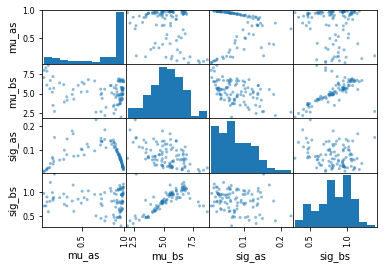

In [122]:

fig = make_subplots(rows=1, cols=4)


# MEANS
mu_as   = alpha.values.mean(axis=0)
mu_bs   = beta.values.mean(axis=0)
sig_as  = alpha.values.std(axis=0)
sig_bs  = beta.values.std(axis=0)
dt      = pd.DataFrame({'mu_as':mu_as, 'mu_bs':mu_bs, 'sig_as':sig_as, 'sig_bs':sig_bs}) 
crr = dt.corr()


pd.plotting.scatter_matrix(dt);
# import seaborn as sns
# sns.heatmap(crr, annot=True)
# plt.show()

# for c in range(4):fig.add_trace( go.Scatter(x=X.iloc[:,c], y=mu_as, mode='markers', marker_color=cols[c], name=X.columns[c], showlegend=True), row=1, col=c+1)



# a_mu      = data['ran']['a_mu']
# b_mu      = data['ran']['b_mu']
# alpha     = data['ran']['alpha']
# beta      = data['ran']['beta']


# fig.update_layout(height=1200, width=1500, title_text=title_text, template='none')

# fig.show()

# Covariate Plots

In [113]:
# Scatter plots 
X = np.log(psy_top100.iloc[:,2:])
X = psy_top100.iloc[:,2:]**2
X = psy_ran100.iloc[:,2:]

cols = [c1,c2,c3,c4,c5,c6,c1]

from plotly.subplots import make_subplots




def covar_plots(X, title_text="Psychological Covariates") -> fig:
    ncols = len(X.columns)
    fig = make_subplots(rows=4, cols=ncols)


    # MEANS
    mu_as = alpha.values.mean(axis=0)
    mu_bs = beta.values.mean(axis=0)
    for c in range(ncols):fig.add_trace( go.Scatter(x=X.iloc[:,c], y=mu_as, mode='markers', marker_color=cols[c], name=X.columns[c], showlegend=True), row=1, col=c+1)
    for c in range(ncols):fig.add_trace( go.Scatter(x=X.iloc[:,c], y=mu_bs, mode='markers', marker_color=cols[c], name=X.columns[c], showlegend=False), row=2, col=c+1)


    # MEANS
    sig_as = alpha.values.std(axis=0)
    sig_bs = beta.values.std(axis=0)
    for c in range(ncols):fig.add_trace( go.Scatter(x=X.iloc[:,c], y=sig_as, mode='markers', marker_color=cols[c], name=X.columns[c], showlegend=False),  row=3, col=c+1)
    for c in range(ncols):fig.add_trace( go.Scatter(x=X.iloc[:,c], y=sig_bs, mode='markers', marker_color=cols[c], name=X.columns[c], showlegend=False), row=4, col=c+1)


    fig.update_layout(height=1200, width=1500, title_text=title_text, template='none')

    fig.show()


covar_plots(X=psy_ran100.iloc[:,2:], title_text="Psychological Covariates")
covar_plots(X=dem_ran100.iloc[:,2:], title_text="Demographic Covariates")

In [ ]:
# Scatter plots 
X = np.log(psy_top100.iloc[:,2:])
X = psy_top100.iloc[:,2:]**2
X = psy_top100.iloc[:,2:]
y = alpha.values.mean(axis=0)
y_ = beta.values.mean(axis=0)
cols = [c1,c2,c3,c4,c5,c6,c1]

from plotly.subplots import make_subplots

ncols = len(X.columns)
fig = make_subplots(rows=2, cols=ncols)


for c in range(ncols):fig.add_trace( go.Scatter(x=X.iloc[:,c], y=y, mode='markers', marker_color=cols[c], name=X.columns[c], showlegend=True), row=1, col=c+1)

for c in range(ncols):fig.add_trace( go.Scatter(x=X.iloc[:,c], y=y_, mode='markers', marker_color=cols[c], name=X.columns[c], showlegend=False), row=2, col=c+1)


fig.update_layout(height=600, width=1500, title_text="Side By Side Subplots", template='none')

fig.show()

# fig.update_layout(
#     title='Iris Data set',
#     width=600,
#     height=600,
# )

# fig.show()


In [13]:
X = psy_top100.iloc[:,2:]
X

# X = dem_top100.iloc[:,2:]
# Xfitts_mean_deviation	nback_status	nback_reaction_time_ms	navon_perc_correct	navon_reaction_time_ms	corsi_block_span

y = alpha.mean(axis=0)


# [x,y) for x in X]
psy_top100


,Unnamed: 0,participant,wcst_RT,fitts_mean_deviation,nback_status,nback_reaction_time_ms,navon_perc_correct,navon_reaction_time_ms,corsi_block_span
0,0,388850.0,1243.94,-152.30,0.9750,2194.9000,0.615385,831.038462,8.0
1,100,951022.0,1264.49,11.95,0.8375,2502.2250,0.839744,711.147436,7.0
2,200,919015.0,1528.54,-170.75,0.8625,2365.3625,0.676282,800.554487,6.0
3,300,948779.0,1287.13,-58.20,0.9875,2184.5000,0.759615,821.871795,6.0
4,400,552414.0,1614.98,-58.50,0.7000,3000.0000,0.637821,861.516026,0.0
...,...,...,...,...,...,...,...,...,...
95,9500,107700.0,1415.35,-342.65,0.9500,2138.7750,0.919872,710.958333,6.0
96,9600,812735.0,1292.85,-148.20,0.9750,2147.0500,0.878205,704.573718,5.0
97,9700,412246.0,2151.25,-143.05,0.6750,1496.2875,0.500000,2345.730769,0.0
98,9800,152049.0,1539.14,-178.70,0.6000,1360.2000,0.846154,949.192308,7.0


Psych models: 
----------------------------------------
F-test: 
[0.03007111 0.09032047 0.00713584 1.         0.38910874 0.15464123
 0.1142285 ]
----------------------------------------
Mutual Info: 
[0.38550099 0.         0.02479874 0.1195308  1.         0.
 0.        ]
----------------------------------------
Correlation: 
[0.03622417348522401, 0.0626969935102153, -0.017654837395205045, 0.20460788976663988, -0.12929554800715407, 0.08192364034318314, 0.07047174377525335]


In [ ]:

plt.figure(figsize=(15, 5))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.scatter(X[:, i], y, edgecolor="black", s=20)
    plt.xlabel("$x_{}$".format(i + 1), fontsize=14)
    if i == 0:
        plt.ylabel("$y$", fontsize=14)
    plt.title("F-test={:.2f}, MI={:.2f}".format(f_test[i], mi[i]), fontsize=16)
plt.show()

In [149]:
X = psy_ran100.iloc[:,2:]

(100, 7)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

In [219]:
y = mu_as
y = sig_as
X = psy_ran100.iloc[:,2:].to_numpy()


from pygam import LinearGAM, s, f
from pygam.datasets import wage

# X, y = w/age(return_X_y=True)

# ## model
gam = LinearGAM(n_splines=10)


lam = np.logspace(-3, 5, 5)
lams = [lam] * X.shape
gam.gridsearch(X, y, lam=lams)
gam.summary()


yhat = gam.predict(X)

plt.plot(yhat)
plt.plot(y)

gam.summary()


ValueError: lam grid should have 7 columns, but found grid with 3 columns

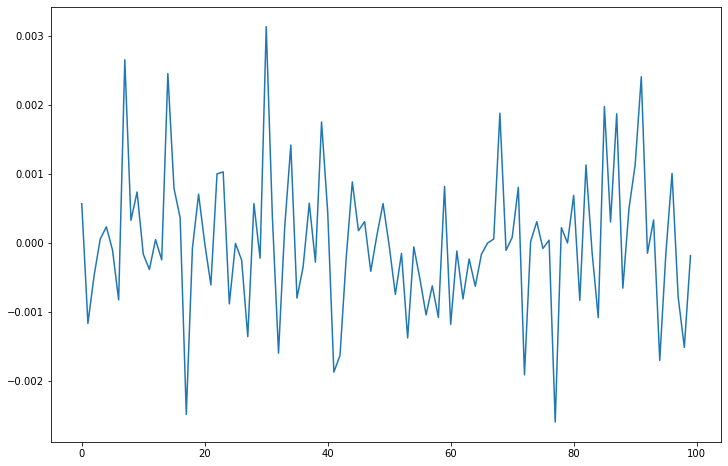

In [203]:
plt.plot(yhat-y)

# pyGAM

In [142]:
# Tutorial: https://www.youtube.com/watch?v=XQ1vk7wEI7c
# !conda install -c conda-forge pyGAM -y
from pygam import GAM, s, te

GAM(s(0, n_splines=200) + te(3,1) + s(2), distribution='poisson', link='log')

GAM(callbacks=['deviance', 'diffs'], distribution='poisson', 
   fit_intercept=True, link='log', max_iter=100, 
   terms=s(0) + te(3, 1) + s(2), tol=0.0001, verbose=False)

In [185]:
from pygam import PoissonGAM, s, te, LinearGAM
from pygam.datasets import chicago

X, y = chicago(return_X_y=True)

gam = PoissonGAM(n_splines=20).gridsearch(X, y)
gam.summary()

N/A% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:593: RuntimeWarning:

divide by zero encountered in reciprocal

/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:752: RuntimeWarning:

divide by zero encountered in reciprocal

  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:04/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:593: RuntimeWarning:

divide by zero encountered in reciprocal

/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:752: RuntimeWarning:

divide by zero encountered in reciprocal

 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:04/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:593: RuntimeWarning:

divide by zero encountered in reciprocal

/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pygam/pygam.py:752: RuntimeWarni

PoissonGAM                                                                                                
=============================================== ==========================================================
Distribution:                       PoissonDist Effective DoF:                                     58.4022
Link Function:                          LogLink Log Likelihood:                                -19510.8848
Number of Samples:                         4863 AIC:                                             39138.574
                                                AICc:                                           39140.0682
                                                UBRE:                                               3.4788
                                                Scale:                                                 1.0
                                                Pseudo R-Squared:                                    0.251
Feature Function                  Lam

/var/folders/kd/p1z7_f_974d7tkw1zmvskn_m0000gn/T/ipykernel_42833/300722857.py:7: UserWarning:

KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 




In [183]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

plt.ion()
plt.rcParams['figure.figsize'] = (12, 8)

IndexError: tuple index out of range

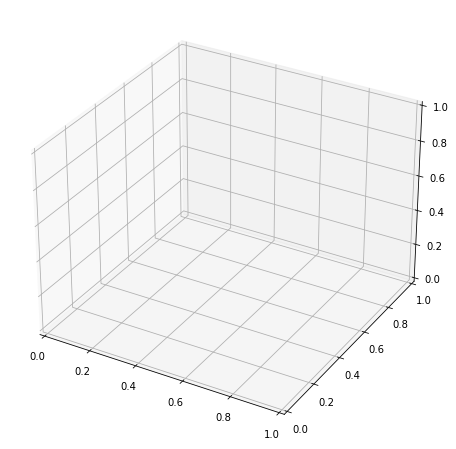

In [184]:
XX = gam.generate_X_grid(term=1, meshgrid=True)
Z = gam.partial_dependence(term=1, X=XX, meshgrid=True)

ax = plt.axes(projection='3d')
ax.plot_surface(XX[0], XX[1], Z, cmap='viridis')

In [169]:
XX
XX[1]

IndexError: tuple index out of range

In [8]:
X = dem_top100.iloc[:,2:]


In [259]:
# Scatter plots 
X = np.log(psy_top100.iloc[:,2:])
X = psy_top100.iloc[:,2:]**2
X = dem_top100.iloc[:,2:]
y = alpha.values.mean(axis=0)
y_ = beta.values.mean(axis=0)
cols = [c1,c2,c3,c4,c5,c6,c1]

from plotly.subplots import make_subplots

ncols = len(X.columns)
fig = make_subplots(rows=2, cols=ncols)


for c in range(ncols):fig.add_trace( go.Scatter(x=X.iloc[:,c], y=y, mode='markers', marker_color=cols[c], name=X.columns[c], showlegend=True), row=1, col=c+1)

for c in range(ncols):fig.add_trace( go.Scatter(x=X.iloc[:,c], y=y_, mode='markers', marker_color=cols[c], name=X.columns[c], showlegend=False), row=2, col=c+1)


fig.update_layout(height=600, width=1500, title_text="Side By Side Subplots", template='none')

fig.show()

# fig.update_layout(
#     title='Iris Data set',
#     width=600,
#     height=600,
# )

# fig.show()

In [267]:
for i in range(X.shape[1]):
    print(np.corrcoef(np.log(X.iloc[:,i]),y)[0,1])

0.05366746123421893
-0.08225337266385999
nan
0.04977021269844525


/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

divide by zero encountered in log

/Users/zachwolpe/.local/lib/python3.9/site-packages/numpy/lib/function_base.py:2487: RuntimeWarning:

invalid value encountered in subtract



In [256]:
import numpy as np
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import StandardScaler

from sklearn.svm import SVC
clf = make_pipeline(StandardScaler(), SVC(gamma='auto'))
clf.fit(X, y >= 0.8)
Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(gamma='auto'))])

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(gamma='auto'))])

In [257]:
print(clf.predict(X))

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True]


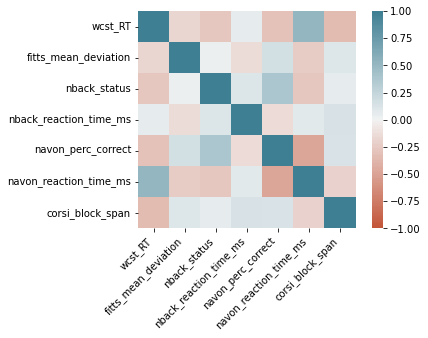

In [253]:
np.corrcoef(X)
import seaborn as sns
corr = X.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [250]:
from sklearn import svm

regr = svm.SVR()
regr.fit(X, y)

regr.predict(X)
1 - (np.sum((y-regr.predict(X))**2) / np.sum((y-np.mean(y))**2))
# array([1.5])

0.041502727181052745

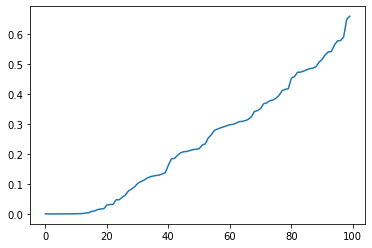

In [241]:
# px.scatter(pd.Series(y).sort_values())
y_ = pd.Series(y).sort_values().reset_index(drop=False)
plt.plot((y_[0])**20)


In [206]:
X_full = psy_ran100.iloc[:,2:].join(dem_ran100.iloc[:,2:])

In [207]:

import statsmodels.api as sm



y = sig_as
y = mu_as
X = psy_ran100.iloc[:,2:].to_numpy()
X_ = sm.add_constant(X_full)
X_

# # Fit and summarize OLS model


res = sm.OLS(y, X_).fit()

print(res.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.158
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     1.496
Date:                Wed, 26 Jan 2022   Prob (F-statistic):              0.147
Time:                        15:07:25   Log-Likelihood:                -15.565
No. Observations:                 100   AIC:                             55.13
Df Residuals:                      88   BIC:                             86.39
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
const 

0     0.916065
1     0.851373
2     0.879317
3     0.907660
4     0.813656
        ...   
95    0.879506
96    0.889371
97    0.942174
98    0.857771
99    0.881755
Length: 100, dtype: float64

In [195]:
import numpy as np

import statsmodels.api as sm



In [188]:
# plot 

from statsmodels.tools.tools import pinv_extended
import statsmodels.api as sm
import sklearn, statsmodels

def regression_analysis(X, y, model):
    
    is_statsmodels = False
    is_sklearn = False
    
    # check for accepted linear models
    if type(model) in [sklearn.linear_model._base.LinearRegression,
                       sklearn.linear_model._ridge.Ridge,
                       sklearn.linear_model._ridge.RidgeCV,
                       sklearn.linear_model._coordinate_descent.Lasso,
                       sklearn.linear_model._coordinate_descent.LassoCV,
                       sklearn.linear_model._coordinate_descent.ElasticNet,
                       sklearn.linear_model._coordinate_descent.ElasticNetCV,
                      ]:
        is_sklearn = True
    elif type(model) in [statsmodels.regression.linear_model.OLS, 
                         statsmodels.base.elastic_net.RegularizedResults,
                        ]:
        is_statsmodels = True
    else:
        print("Only linear models are supported!")
        return None
    
    
    
    has_intercept = False
    
    if is_statsmodels and all(np.array(X)[:,0]==1):
        # statsmodels add_constant has been used already
        has_intercept = True  
    elif is_sklearn and model.intercept_:
        has_intercept = True
        

    
    if is_statsmodels:
        # add_constant has been used already
        x = X
        model_params = model.params
    else: # sklearn model
        if has_intercept:
            x = sm.add_constant(X)
            model_params = np.hstack([np.array([model.intercept_]), model.coef_])
        else:
            x = X
            model_params = model.coef_
        
    #y = np.array(y).ravel()
    
    # define the OLS model
    olsModel = sm.OLS(y, x)
    
    pinv_wexog,_ = pinv_extended(x)
    normalized_cov_params = np.dot(pinv_wexog, np.transpose(pinv_wexog))
    
    
    return sm.regression.linear_model.OLSResults(olsModel, model_params, normalized_cov_params)
    

In [189]:
X = psy_ran100.iloc[:,2:]
y = sig_as


In [211]:
from sklearn.linear_model import Ridge, RidgeCV


skridge = Ridge(alpha=0.2, max_iter=9000, tol=1e-5, fit_intercept=False)

X = dem_ran100.iloc[:,2:]
skridge = RidgeCV(fit_intercept=False)
skridge.fit(X_full,y)

result = regression_analysis(X_full, y, skridge)
result.summary()

/Users/zachwolpe/miniforge3/lib/python3.9/site-packages/sklearn/linear_model/_ridge.py:1791: RuntimeWarning:

divide by zero encountered in reciprocal



<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.873
Model:                            OLS   Adj. R-squared (uncentered):              0.857
Method:                 Least Squares   F-statistic:                              55.65
Date:                Wed, 26 Jan 2022   Prob (F-statistic):                    4.63e-35
Time:                        15:10:33   Log-Likelihood:                         -16.508
No. Observations:                 100   AIC:                                      55.02
Df Residuals:                      89   BIC:                                      83.67
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
=====================================================================================================
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
wcst_RT                            2.356e-05   6.86e-05      0.344      0.732      -0.000       0.000
fitts_mean_deviation               9.539e-05      0.000      0.872      0.386      -0.000       0.000
nback_status                         -0.0156      0.229     -0.068      0.946      -0.470       0.439
nback_reaction_time_ms                0.0001   6.61e-05      1.726      0.088   -1.73e-05       0.000
navon_perc_correct                    0.0190      0.155      0.123      0.902      -0.289       0.327
navon_reaction_time_ms             2.579e-05   4.97e-05      0.519      0.605    -7.3e-05       0.000
corsi_block_span                      0.0186      0.013      1.435      0.155      -0.007       0.044
demographics_mean_reation_time_ms  8.603e-06   8.92e-06      0.964      0.338   -9.13e-06    2.63e-05
demographics_income_a                 0.0547      0.015      3.687      0.000       0.025       0.084
demographics_computer_hours_a        -0.0022      0.001     -1.663      0.100      -0.005       0.000
demographics_age_a                    0.0019      0.003      0.725      0.470      -0.003       0.007
==============================================================================
Omnibus:                       12.571   Durbin-Watson:                   2.125
Prob(Omnibus):                  0.002   Jarque-Bera (JB):               14.139
Skew:                          -0.920   Prob(JB):                     0.000851
Kurtosis:                       3.068   Cond. No.                     7.83e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 7.83e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

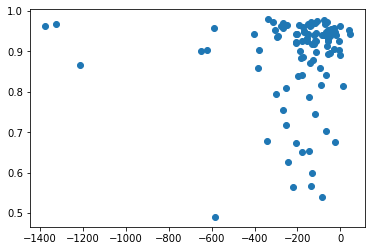

In [37]:
len(X.columns)

Index(['wcst_RT', 'fitts_mean_deviation', 'nback_status',
       'nback_reaction_time_ms', 'navon_perc_correct',
       'navon_reaction_time_ms', 'corsi_block_span'],
      dtype='object')

In [8]:
bio_model_top['arr_0'].tolist().keys()

# alpha.mean

colorscale = ['#7A4579', '#D56073', 'rgb(236,158,105)', (1, 1, 0.2), (0.98,0.98,0.98)]


import plotly.figure_factory as ff

fig = ff.create_2d_density(
    b_mu, a_mu, 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()


fig = ff.create_2d_density(
    mu_bs, mu_as, 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()


fig = ff.create_2d_density(
    sig_bs, sig_as, 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()


odict_keys(['a_mu_raw', 'b_mu_raw', 'a_sd_raw', 'b_sd_raw', 'a_raw', 'b_raw', 'a', 'b', 'a_mu', 'b_mu', 'log_lik', 'lp__'])

In [218]:
colorscale = ['#7A4579', '#D56073', 'rgb(236,158,105)', (1, 1, 0.2), (0.98,0.98,0.98)]


import plotly.figure_factory as ff

fig = ff.create_2d_density(
    b_mu, a_mu, 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()


fig = ff.create_2d_density(
    mu_bs, mu_as, 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()


fig = ff.create_2d_density(
    sig_bs, sig_as, 
    colorscale=colorscale,
    hist_color='rgb(255, 237, 222)',
    point_size=3
)
fig.show()

In [217]:

dt      = pd.DataFrame({'mu_as':mu_as, 'mu_bs':mu_bs, 'sig_as':sig_as, 'sig_bs':sig_bs}) 


fig = go.Figure(data=[go.Surface(x=dt['mu_as'], x=dt['mu_bs'], z=dt['sig_as'])])

fig.update_layout(title='Mt Bruno Elevation', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

SyntaxError: keyword argument repeated: x (1077640282.py, line 4)

In [ ]:
y = alpha.mean(axis=0)
X = psy_top100.iloc[:, 2:]

In [ ]:
from sklearn.linear_model import Ridge
import numpy as np
clf = Ridge(alpha=1.0)
fit = clf.fit(X, y)

NameError: ignored

# WAIC

In [ ]:
import arviz as az
az.plot_trace(fit);

In [ ]:
import arviz as az
az.plot_trace(fit);

In [ ]:
import arviz as az
az.plot_trace(fit);
np.max(fit['a_mu_raw'])
print(fit_2)
az.plot_trace(fit_2);
loo, loos, ks = psisloo(fit_2['log_lik'])
print('PSIS-LOO value: {:.2f}'.format(loo))